In [ ]:
# Unzip the uploaded data into Google Drive
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

# 🐶 End-to-end Multi-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data
The data I‘m using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:

* I'm dealing with images (unstructured data) so it's probably best I use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because I'll want to predict them).


### Get my workspace ready

* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure I'm using a GPU ✅

In [ ]:
# Import TensorFlow into Colab
import tensorflow as tf
print('TF version:', tf.__version__)

TF version: 2.8.2


In [ ]:
# Import necessary tools
import tensorflow_hub as hub
print('TF version:', hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

TF version: 0.12.0
GPU available (YESSSS!!!!!)


## Getting my data ready (turning into tensors)

With all machine learning models, my data has to be in numerical format. So that's what I'll be doing first. Turning my images into Tensors (numerical representations).

Let me start by accessing my data and checking out the labels.

In [ ]:
# Checkout the labels of my data
import pandas as pd
labels_csv = pd.read_csv('/content/drive/MyDrive/Dog Vision/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each breed?
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

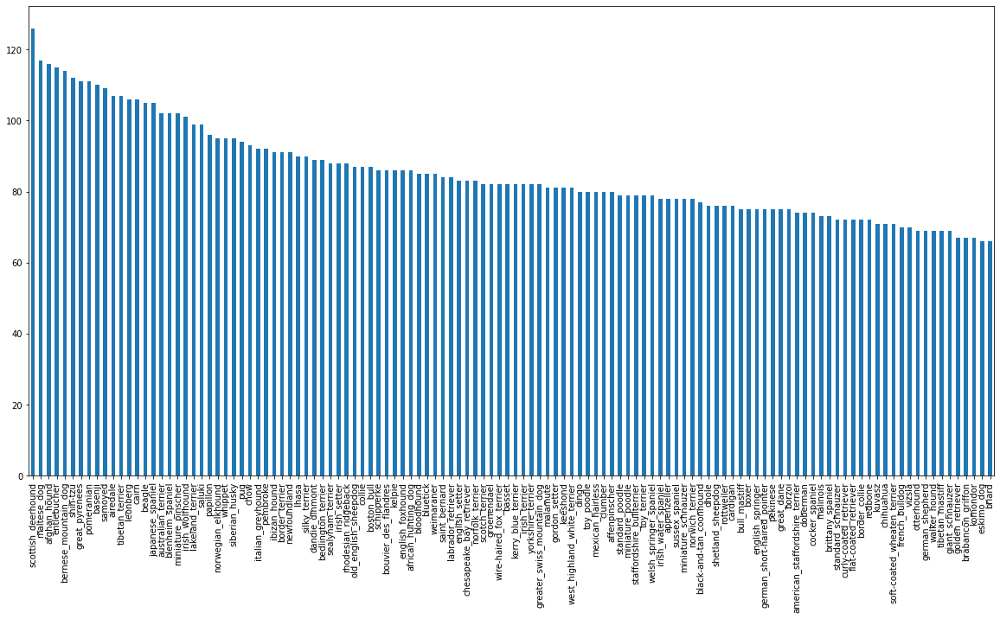

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

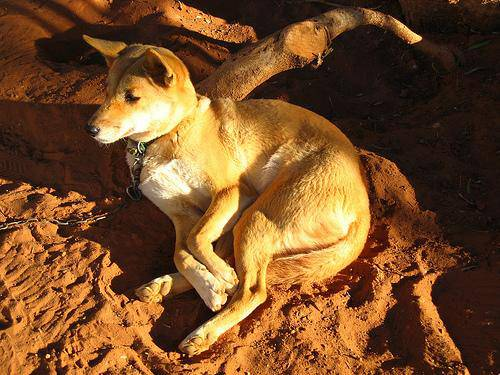

In [ ]:
# Let me view an image
from IPython.display import Image
Image('/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg')

### Getting images and their labels

Let me get a list of all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image IDs
filenames = ['/content/drive/MyDrive/Dog Vision/train/'+fname+'.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]


['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filenames matches number of actual image files
import os
if len(os.listdir('/content/drive/MyDrive/Dog Vision/train')) == len(filenames):
  print('Filenames match actual amount of files!!! Proceed.')
else:
  print("Filenames do no match actual amount of files, check the target directory.")



Filenames match actual amount of files!!! Proceed.


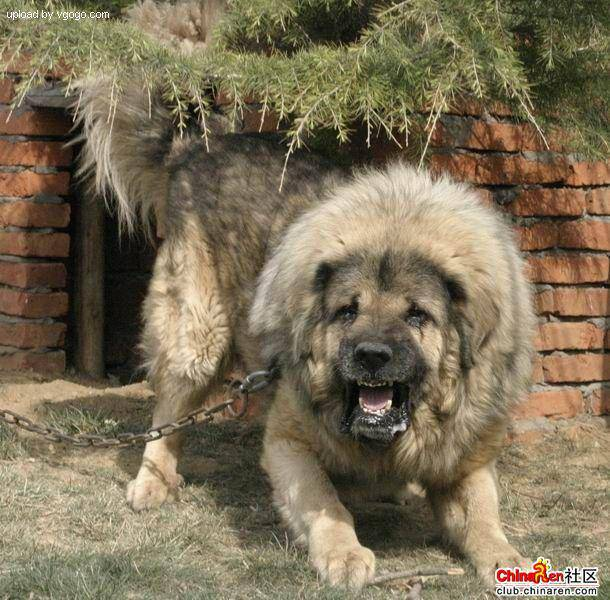

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since I've now got my training image filepaths in a list, let me prepare my labels.



In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# or labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
len(labels_csv['id'])

10222

In [ ]:
# See if number of labels matches the number of filenames
if len('labels') == len(filenames):
  print('Number of labels matches number of filenames!')
else:
  print('Number of labels does not match number of filenames, check data directories!')


Number of labels does not match number of filenames, check data directories!


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Tuen every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating my own validation set

Since the dataset from Kaggle doesn't come with a validation set, I'm going to create my own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(filenames)

10222

I'm going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for experimenting 
NUM_IMAGES = 1000 #@param {type:'slider', min:1000, max:10000, step:1000}

In [ ]:
# Let me split my data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)


(800, 800, 200, 200)

In [ ]:
# Let me have a geez at the training data
X_train[:5], y_train[:2]

(['/content/drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  '/content/drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  '/content/drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  '/content/drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         Fals

## Preprocessing images (turning images into Tensors)

Tensor is numerical representative kind of like matrix

To preprocess my images into Tensors I'm going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn my `image` (a jpg) into Tensors
4. Normalize my image (convert color channel values from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

Before I do, let me see what importing an image looks like.

In [ ]:
filenames[42]

'/content/drive/MyDrive/Dog Vision/train/011e06760794850c40f23d6426c40774.jpg'

In [ ]:
# Convert image to numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape # the last digit of shape is color channel

(257, 350, 3)

In [ ]:
# image a 3-dim (red, green, blue) numpy and its pixels ranges from 0 to 255
image


array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  53],
        [ 97,  88,  49],
        [120, 111,  72]]

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2] # Same value but tensors can be run at GPU which will be much faster

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now I've seen what an image looks like as a Tensor, let me make a function to preprocess them。

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn my `image` (a jpg) into Tensors
4. Normalize my image (convert color channel values from 0-255 to 0-1).
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (red, green, blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values # Normalize my image can make computing faster
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to my desired value (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE,IMG_SIZE])

  return image

In [ ]:
tensor = tf.io.read_file(filenames[26])
tensor

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01\xf4\x01w\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
tensor1 =tf.image.decode_jpeg(tensor,channels=3)
tensor1

<tf.Tensor: shape=(500, 375, 3), dtype=uint8, numpy=
array([[[ 59,  68,  65],
        [ 64,  73,  70],
        [ 71,  80,  77],
        ...,
        [115, 128, 108],
        [115, 128, 108],
        [110, 123, 103]],

       [[ 65,  74,  71],
        [ 72,  81,  78],
        [ 79,  88,  85],
        ...,
        [114, 127, 107],
        [117, 130, 110],
        [116, 129, 109]],

       [[ 68,  77,  74],
        [ 76,  85,  82],
        [ 83,  92,  89],
        ...,
        [114, 127, 107],
        [120, 133, 113],
        [123, 136, 116]],

       ...,

       [[173, 200, 155],
        [164, 179, 136],
        [181, 166, 133],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[142, 159, 117],
        [147, 154, 113],
        [189, 174, 141],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[167, 179, 139],
        [167, 172, 132],
        [204, 188, 155],
        ...,
        [255, 255, 25

In [ ]:
# Same shape with tensor1 but change range from 0-255 to 0-1 to make computing faster
tensor2 = tf.image.convert_image_dtype(tensor1, tf.float32) 
tensor2

<tf.Tensor: shape=(500, 375, 3), dtype=float32, numpy=
array([[[0.23137257, 0.26666668, 0.25490198],
        [0.2509804 , 0.28627452, 0.27450982],
        [0.2784314 , 0.3137255 , 0.3019608 ],
        ...,
        [0.45098042, 0.5019608 , 0.42352945],
        [0.45098042, 0.5019608 , 0.42352945],
        [0.43137258, 0.48235297, 0.4039216 ]],

       [[0.25490198, 0.2901961 , 0.2784314 ],
        [0.28235295, 0.31764707, 0.30588236],
        [0.30980393, 0.34509805, 0.33333334],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.45882356, 0.50980395, 0.43137258],
        [0.454902  , 0.5058824 , 0.427451  ]],

       [[0.26666668, 0.3019608 , 0.2901961 ],
        [0.29803923, 0.33333334, 0.32156864],
        [0.3254902 , 0.36078432, 0.34901962],
        ...,
        [0.44705886, 0.49803925, 0.41960788],
        [0.47058827, 0.52156866, 0.4431373 ],
        [0.48235297, 0.53333336, 0.454902  ]],

       ...,

       [[0.6784314 , 0.7843138 , 0.60784316],
        [0.64

## Turning my data into batches

Why turn my data into batches?

Let me say I'm trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why I do about 32 (this is the batch size) images at a time (I can manually adjust the batch size if need be).

In order to use TensorFlow effectively, I need my data in the form of Tensor tuples which look like this: (image, label).

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of above
(process_image(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now I've got a way to turn my data into tuples of Tensors in the form: (image, label), let me make a function to turn all of my data (X & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  '''
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  '''
  # If the data is a test dataset, I probably don't have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data is a valid dataset, I don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                          tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print('Creating training data batches...')
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                          tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(X))

    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image)
    data = data.map(get_image_label)
                    
    # Turn the training data into batches)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of my data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

My data is now in batches, however, these can be a little hard to understand/comprehend, let me visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing image in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize=(10,10))
  # Loop through 25 for (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)   
    # Display an image
    plt.imshow(images[i])
    # Add the image label as title
    plt.title(unique_breeds[labels[i].argmax()]) #argmax find the max value which is '1'
    # Turn the grid lines off
    plt.axis('off')

In [ ]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

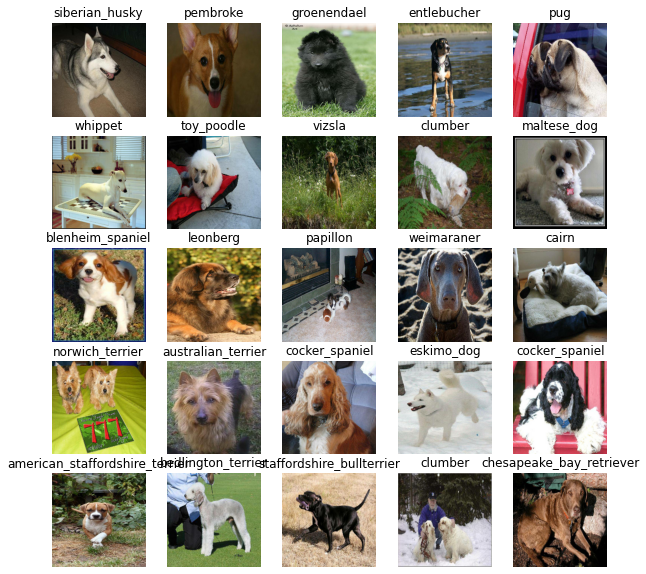

In [ ]:
# Now let me visualize the data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

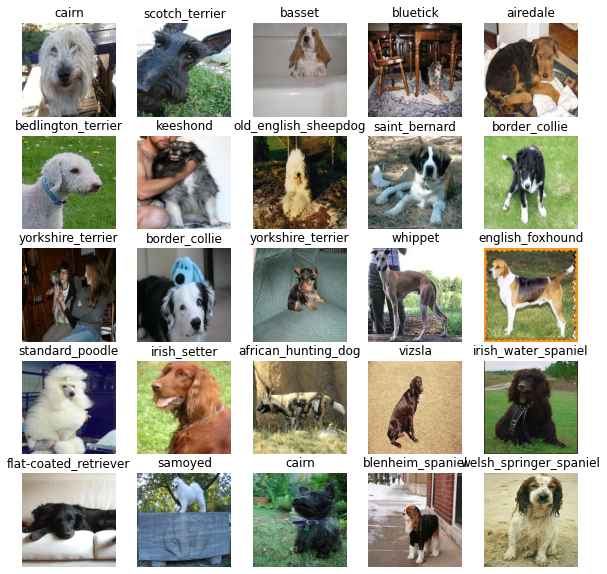

In [ ]:
# Now let me visualize my validation set (pic)
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before I build a model, there are a few things I need to define:

* The input shape (my images shape, in the form of Tensors) to my model.
* The output shape (image labels, in the form of Tensors) of my model.
* The URL of the model I want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, colour channels

# Setup output shape of my model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now I've got my inputs, outputs and model ready to go. Let me put them together into a Keras deep learning model!

Knowing this, let me create a function which:

* Takes the input shape, output shape and the model I've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.
All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview


In [ ]:
# Create a function which builds a Keras model （Keras is API connected with tensorflow which is the main backend of Keras)
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE, activation='softmax') # Layer 2 (output layer) (Binary will use Sigmoid rather than softmax, softmax will make input between 0-1 and unit will be set to 120 rather than 1024, and the value of them will be added equal to 1)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Loss is how well a model predice, less loss, better model
      optimizer=tf.keras.optimizers.Adam(), # Optimizer helps model predict, adam is an optimizer performs well in most models
      metrics=['accuracy'] # A way evaluating how well a model predicts
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_2 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Create callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

I'll create two callbacks, one for TensorBoard which helps track my models progress and another for early stopping which prevents my model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, I need to do 3 things:

1. Load the TensorBoard notebook extension ✅
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to my model's `fit()` function. ✅
3. Visualize my models training logs with the `%tensorboard` magic functio (I'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join('/content/drive/MyDrive/Dog Vision/logs',
              # Make it so the logs get tracked whenever I run an experiment
              datetime.datetime.now().strftime('%Y%M%D-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop my model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience = 3)

## Training a model (on subset of data)

My first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS=100 #@param {type:'slider', min:10, max:100, step:10}

In [ ]:
# Check to make sure I are still running on a GPU
print('GPU', 'availabel (YES!!!!!)' if tf.config.list_physical_devices('GPU') else 'not availabel :(')

GPU availabel (YES!!!!!)


Let me create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on my model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks I'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version
  '''
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime I train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks I created
  model.fit(x=train_data,
       epochs=NUM_EPOCHS,
       validation_data=val_data,
       validation_freq=1,
       callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [ ]:
# !pip install tensorflow==2.8
# !apt install --allow-change-held-packages libcudnn8=8.1.0.77-1+cuda11.2
# !pip install numpy --upgrade --ignore-installed

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 19s 430ms/step - loss: 4.8206 - accuracy: 0.0763 - val_loss: 3.6405 - val_accuracy: 0.2100
Epoch 2/100
25/25 [==============================] - 5s 197ms/step - loss: 1.7506 - accuracy: 0.6525 - val_loss: 2.2503 - val_accuracy: 0.4850
Epoch 3/100
25/25 [==============================] - 4s 171ms/step - loss: 0.6080 - accuracy: 0.9212 - val_loss: 1.7474 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 173ms/step - loss: 0.2685 - accuracy: 0.9887 - val_loss: 1.5441 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 4s 153ms/step - loss: 0.1547 - accuracy: 0.9962 - val_loss: 1.4645 - val_accuracy: 0.6100
Epoch 6/100
25/25 [==============================] - 6s 247ms/step - loss: 0.1053 - accuracy: 1.0000 - val_loss: 1.4158 - val_accuracy: 0.6300
Epoch 7/100
25/25 [=============================

**Question:** It looks like my model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means my model is learning!!!

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory I created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir /content/drive/My\ Drive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 1s 93ms/step


array([[5.3087007e-03, 1.1538479e-04, 4.7511293e-04, ..., 2.2730649e-04,
        2.0367473e-04, 4.8538167e-02],
       [3.6555491e-03, 2.8165821e-03, 3.0047940e-03, ..., 5.8129022e-04,
        9.5304864e-04, 7.4106175e-04],
       [6.4604319e-05, 3.6797130e-05, 1.3002577e-04, ..., 5.4490196e-05,
        1.7127430e-04, 5.7672482e-04],
       ...,
       [7.1852668e-07, 1.1460681e-04, 3.4504153e-06, ..., 3.1788277e-05,
        3.6698020e-05, 3.1858657e-05],
       [3.6276607e-03, 4.9243908e-04, 3.1123642e-04, ..., 1.3864606e-04,
        8.4002029e-05, 1.3581695e-02],
       [2.1237340e-04, 5.1770494e-05, 6.5392477e-04, ..., 6.5442319e-03,
        9.9623320e-04, 1.0389995e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
# shows the probability of each label predict, the highest value will be the label predicted (which breed)
predictions[0]

array([5.30870073e-03, 1.15384792e-04, 4.75112931e-04, 1.44705627e-04,
       1.97591187e-04, 6.11363939e-05, 1.55102210e-02, 2.41371081e-03,
       2.66175222e-04, 1.11841131e-03, 4.97317524e-04, 3.56110650e-05,
       1.40184048e-03, 1.89923041e-04, 1.94192151e-04, 2.66540854e-04,
       7.78007088e-05, 3.99117261e-01, 1.14332361e-04, 1.08447966e-04,
       4.76661633e-04, 4.47944221e-05, 1.50868364e-04, 3.46645655e-04,
       2.34971067e-05, 6.39773149e-04, 1.18213631e-01, 1.45479207e-04,
       1.35769427e-03, 2.04444368e-04, 6.51475741e-04, 8.74626334e-04,
       1.48000836e-04, 1.01090016e-04, 1.69334118e-04, 7.96313491e-03,
       1.29623630e-04, 1.56718132e-03, 2.08800120e-04, 6.07532915e-04,
       2.43105553e-03, 4.93365951e-05, 3.37032776e-04, 1.67609687e-04,
       2.30194364e-05, 2.23752868e-04, 1.61377087e-04, 3.09233670e-04,
       7.38559524e-04, 6.77300966e-04, 3.12571756e-05, 2.61791902e-05,
       4.21780191e-04, 1.96183348e-04, 4.71706044e-05, 9.56286240e-05,
      

In [ ]:
np.sum(predictions[0])

0.9999999

In [ ]:
# First prediction 
index = 42
print(predictions[index])
print(f'Max value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predicted label: {unique_breeds[np.argmax(predictions[index])]}')

[6.97860014e-05 5.47804593e-05 2.16625504e-05 1.98967391e-04
 5.86620590e-04 7.94383668e-05 3.51814931e-04 1.30162609e-03
 1.18537406e-02 2.04698965e-02 4.66190204e-06 4.39769929e-06
 2.61678390e-04 1.80538814e-03 1.81699288e-04 5.91832213e-04
 4.61106174e-06 2.47333461e-04 2.68909702e-04 1.25805658e-04
 7.68273276e-06 1.62405762e-04 3.99924138e-05 4.93710868e-05
 8.40336923e-03 4.21620462e-05 7.57898524e-05 1.10429435e-04
 2.44440627e-04 4.17693191e-05 7.08331354e-05 6.40286671e-05
 4.22836129e-05 1.30134367e-05 8.95925950e-06 3.42063254e-06
 3.81544778e-05 2.73781276e-04 3.95900170e-05 2.27687240e-01
 2.36716704e-04 6.21018398e-06 1.18756236e-03 2.29729926e-06
 6.20955325e-05 9.64605570e-05 1.70197498e-04 1.16418472e-04
 1.16483270e-05 5.77604398e-04 2.41947764e-05 4.37211747e-05
 1.53834553e-04 1.07548141e-03 3.19257197e-05 1.69188963e-04
 1.04710389e-05 1.13548413e-05 1.27687163e-04 1.51020267e-05
 3.59086043e-05 3.76644079e-04 2.48890251e-06 8.40079156e-06
 6.69928568e-06 1.767125

In [ ]:
unique_breeds[113]

'walker_hound'

Having the the above functionality is great but I want to be able to do it at scale.

And it would be even better if I could see the image the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label.
  '''

  return unique_breeds[np.argmax(prediction_probabilities)]

  # Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'dingo'

Now since our validation data is still in a batch dataset, I'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
images_ = []
labels_ = []

# Loob through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels
  '''
  images=[]
  labels=[]
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now I've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images
Let me make some function to make these all a bit more visaulize.

I'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the predictions is right or wrong
  if pred_label == true_label:
    color='green'
  else:
    color='red'

  # Change plot title to be predicted, probability of prediction and truth label
  plt.title('{} {:2.2f}% {}'.format(pred_label, np.max(pred_prob)*100, true_label), color = color)



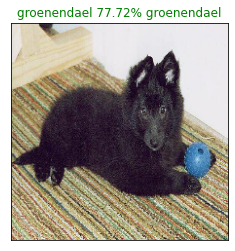

In [ ]:
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=77)

Now I've got one function to visualize my models top prediction, let me make another to view my models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
predictions[0]

array([5.30870073e-03, 1.15384792e-04, 4.75112931e-04, 1.44705627e-04,
       1.97591187e-04, 6.11363939e-05, 1.55102210e-02, 2.41371081e-03,
       2.66175222e-04, 1.11841131e-03, 4.97317524e-04, 3.56110650e-05,
       1.40184048e-03, 1.89923041e-04, 1.94192151e-04, 2.66540854e-04,
       7.78007088e-05, 3.99117261e-01, 1.14332361e-04, 1.08447966e-04,
       4.76661633e-04, 4.47944221e-05, 1.50868364e-04, 3.46645655e-04,
       2.34971067e-05, 6.39773149e-04, 1.18213631e-01, 1.45479207e-04,
       1.35769427e-03, 2.04444368e-04, 6.51475741e-04, 8.74626334e-04,
       1.48000836e-04, 1.01090016e-04, 1.69334118e-04, 7.96313491e-03,
       1.29623630e-04, 1.56718132e-03, 2.08800120e-04, 6.07532915e-04,
       2.43105553e-03, 4.93365951e-05, 3.37032776e-04, 1.67609687e-04,
       2.30194364e-05, 2.23752868e-04, 1.61377087e-04, 3.09233670e-04,
       7.38559524e-04, 6.77300966e-04, 3.12571756e-05, 2.61791902e-05,
       4.21780191e-04, 1.96183348e-04, 4.71706044e-05, 9.56286240e-05,
      

In [ ]:
predictions[0].max

<function ndarray.max>

In [ ]:
predictions[0].argsort()[-10:]

array([  6, 103, 106,  73,  70,  65, 119,  59,  26,  17])

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 17,  26,  59, 119,  65,  70,  73, 106, 103,   6])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.39911726, 0.11821363, 0.09721039, 0.04853817, 0.04159797,
       0.03965761, 0.02841271, 0.02341343, 0.02074146, 0.01551022],
      dtype=float32)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plots the top 10 highest prediction confidences along with the truth label for sample n.
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Settop plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), top_10_pred_values, color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)), labels=top_10_pred_labels, rotation='vertical')

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass


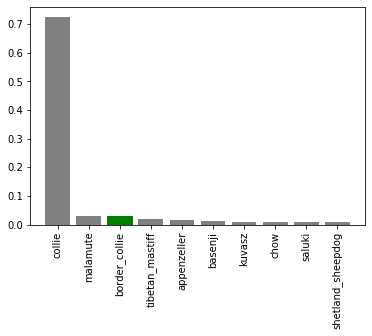

In [ ]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=9)

Now I've got some function to help me visualize my predictions and evaluate my model, let me check out a few.

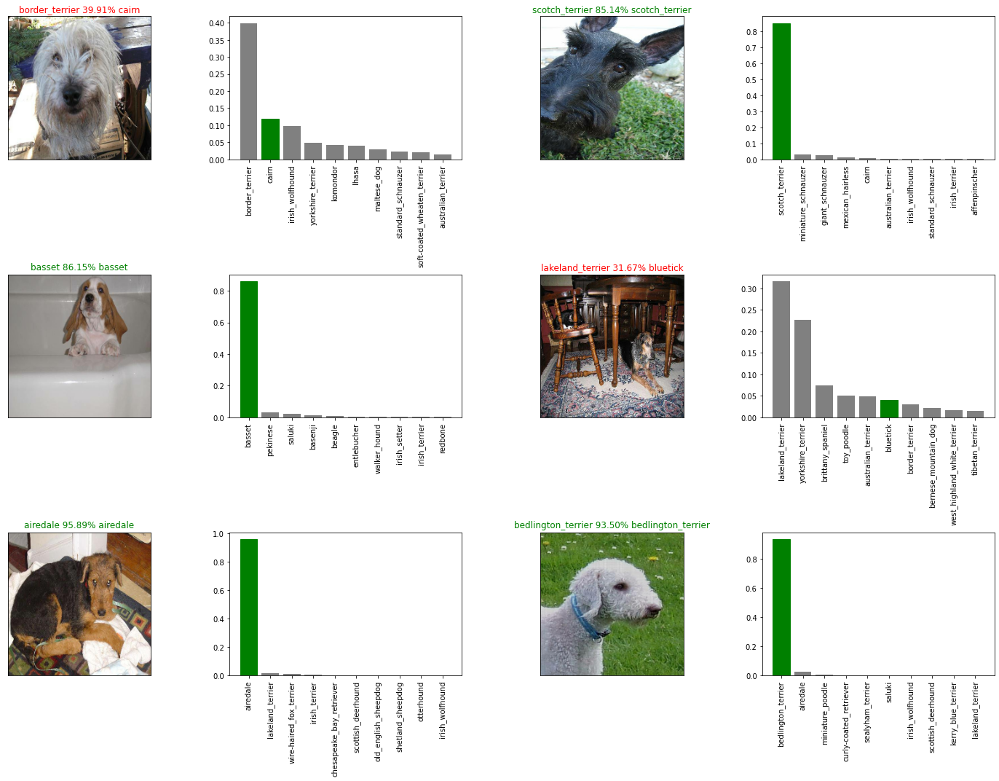

In [ ]:
# Let me check out a few predictions and their different values
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()


**Chanlenge:** How would I create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model

In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  '''
  Saves a given model in a model directory and appends a suffix (string).
  '''
  # Create a model directory pathname with current time
  modeldir = os.path.join('/content/drive/MyDrive/Dog Vision/models', datetime.datetime.now().strftime('%Y%m%d-%H%m%s'))
  model_path = modeldir+'-'+suffix+'.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path, custom_objects={'KerasLayer': hub.KerasLayer})
  return model

Now I've got functions to save and load a trained model, let me make sure they work!

In [ ]:
# Save my model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Vision/models/20220819-04081660883995-1000-images-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20220819-04081660883995-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model = load_model('/content/drive/MyDrive/Dog Vision/models/20220819-04081660883995-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20220819-04081660883995-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 133ms/step - loss: 1.3415 - accuracy: 0.6300


[1.341505765914917, 0.6299999952316284]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 164ms/step - loss: 1.3415 - accuracy: 0.6300


[1.341505765914917, 0.6299999952316284]

## Training a big dog model 🐶 (on the full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['/content/drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback() # Tensorboard can track the performance of model and compare to others
# No validation set when training on all the data, so I cannot monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy', patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes for the first epoch) because the GPU I'm using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data, epochs=NUM_EPOCHS, callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 105ms/step - loss: 1.3194 - accuracy: 0.6734
Epoch 2/100
320/320 [==============================] - 30s 94ms/step - loss: 0.4020 - accuracy: 0.8829
Epoch 3/100
320/320 [==============================] - 32s 99ms/step - loss: 0.2387 - accuracy: 0.9333
Epoch 4/100
320/320 [==============================] - 30s 94ms/step - loss: 0.1552 - accuracy: 0.9638
Epoch 5/100
320/320 [==============================] - 30s 94ms/step - loss: 0.1052 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0765 - accuracy: 0.9856
Epoch 7/100
320/320 [==============================] - 30s 93ms/step - loss: 0.0581 - accuracy: 0.9915
Epoch 8/100
320/320 [==============================] - 30s 94ms/step - loss: 0.0473 - accuracy: 0.9934
Epoch 9/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0371 - accuracy: 0.9963
Epoch 10/100
320/320 [==============================] - 30s 94ms/step - 

In [ ]:
save_model(full_model, suffix='full-image-set-mobilenetv2-Adam')

Saving model to: /content/drive/MyDrive/Dog Vision/models/20220819-05081660886217-full-image-set-mobilenetv2-Adam.h5...


'/content/drive/MyDrive/Dog Vision/models/20220819-05081660886217-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('/content/drive/MyDrive/Dog Vision/models/20220819-05081660886217-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20220819-05081660886217-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset
Since my model has been trained on images in the form of Tensor batches, to make predictions on the test data, I'll have to get it into the same format.

Luckily I created `create_data_batches()` earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, I'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the `predict()` method called on my model. ✅

In [ ]:
# Load test image filenames
test_path = '/content/drive/MyDrive/Dog Vision/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['/content/drive/MyDrive/Dog Vision/test/e6e1e02b07347a522f96eba87d29a5c0.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e70c62f51defaa5295fe3e52099c4ce3.jpg',
 '/content/drive/MyDrive/Dog Vision/test/df38352b1f41c92d6750b87b55488ed4.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e5560686ee44dc59dbb99d6ef4ea54d8.jpg',
 '/content/drive/MyDrive/Dog Vision/test/dea92807aa2ac37bbc2dabf1b0eb6a39.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e6b2cfafb8c0a06c062832369365fa9e.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e241e149039740594a6af60dc18b269b.jpg',
 '/content/drive/MyDrive/Dog Vision/test/ddc0134def0da0472e55271da8b57c44.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e2c0a9f66153b81eb27bb1bceb8c18dd.jpg',
 '/content/drive/MyDrive/Dog Vision/test/e427b9e1ab1b7f09cfb02ac073f56f2d.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on my full model and passing it the test data batch will take a long time to run (about a ~1hr). This is because I have to process ~10,000+ images and get my model to find patterns in those images and generate predictions based on what its learned in the training dataset.

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data, verbose=1)

324/324 [==============================] - 1680s 5s/step


In [ ]:
# Save predictions (Numpy array) to csv file (for access later)
np.savetxt('/content/drive/MyDrive/Dog Vision/preds_array.csv', test_predictions, delimiter=',')

In [ ]:
# Load predictions (Numpy array) from csv file
test_predictions = np.loadtxt('/content/drive/MyDrive/Dog Vision/preds_array.csv', delimiter=',')

In [ ]:
test_predictions[:10]

array([[1.65951150e-07, 9.67648006e-09, 2.25393260e-09, ...,
        3.36725111e-06, 2.19161844e-09, 7.00660436e-08],
       [2.65288204e-12, 2.17136797e-09, 1.29752387e-08, ...,
        6.01618533e-10, 1.48689594e-07, 3.91930204e-11],
       [2.85856001e-13, 1.79586863e-07, 2.79017629e-12, ...,
        6.66088018e-10, 3.28322286e-10, 1.46814002e-11],
       ...,
       [7.68329983e-11, 9.72944690e-07, 4.92921204e-10, ...,
        6.51385506e-08, 1.19449169e-06, 1.50987809e-08],
       [3.00334868e-09, 3.46777078e-08, 5.92175819e-09, ...,
        1.78991797e-07, 2.16675457e-04, 8.07729208e-08],
       [7.48689466e-09, 1.03102691e-08, 1.22081101e-09, ...,
        9.18190024e-10, 9.99372542e-01, 1.04365991e-08]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, I find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed. https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

To get the data in this format, I'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths. ✅
* Add data (the prediction probabilites) to each of the dog breed columns.
Export the DataFrame as a CSV to submit it to Kaggle. ✅

In [ ]:
['id']+list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [ ]:
# Create a panda DataFrame with empty columns
preds_df = pd.DataFrame(columns=['id']+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_path


'/content/drive/MyDrive/Dog Vision/test/'

In [ ]:
# Append test image IDs to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id'] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6e1e02b07347a522f96eba87d29a5c0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e70c62f51defaa5295fe3e52099c4ce3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,df38352b1f41c92d6750b87b55488ed4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e5560686ee44dc59dbb99d6ef4ea54d8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,dea92807aa2ac37bbc2dabf1b0eb6a39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6e1e02b07347a522f96eba87d29a5c0,1.659511e-07,9.676480e-09,2.253933e-09,5.354300e-08,7.867401e-04,3.934945e-07,1.047107e-09,6.597467e-08,4.792529e-08,...,4.213685e-07,4.746333e-07,3.297607e-08,1.237261e-08,2.751360e-04,2.465697e-09,1.156196e-08,3.367251e-06,2.191618e-09,7.006604e-08
1,e70c62f51defaa5295fe3e52099c4ce3,2.652882e-12,2.171368e-09,1.297524e-08,5.386764e-11,1.095008e-10,4.503551e-10,2.882524e-11,8.916267e-08,5.170105e-11,...,2.306954e-11,1.664859e-08,5.737058e-11,1.913201e-10,3.407970e-10,2.184844e-10,3.573001e-10,6.016185e-10,1.486896e-07,3.919302e-11
2,df38352b1f41c92d6750b87b55488ed4,2.858560e-13,1.795869e-07,2.790176e-12,2.096655e-06,3.601710e-09,4.932334e-09,3.544574e-08,1.421175e-11,2.463387e-09,...,2.096788e-12,8.710861e-12,1.738120e-08,1.021239e-06,2.048469e-09,1.458740e-10,6.493813e-13,6.660880e-10,3.283223e-10,1.468140e-11
3,e5560686ee44dc59dbb99d6ef4ea54d8,1.057575e-11,2.401116e-12,1.991592e-10,8.764872e-13,7.033756e-08,1.158074e-07,7.027088e-09,4.140441e-04,4.586344e-09,...,2.706030e-08,7.017180e-08,1.057433e-08,1.693893e-09,1.294543e-10,9.034981e-09,1.173273e-10,6.010013e-09,1.386802e-07,2.131128e-09
4,dea92807aa2ac37bbc2dabf1b0eb6a39,1.068724e-10,2.091205e-09,7.405263e-12,1.759472e-08,1.732440e-13,9.595090e-11,3.595668e-11,3.486535e-12,3.983684e-13,...,2.089192e-09,3.061331e-13,1.125022e-13,4.638696e-11,4.361354e-10,2.515630e-15,1.956562e-14,1.062074e-13,1.166476e-12,7.524171e-13


In [ ]:
# Save our predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv('/content/drive/MyDrive/Dog Vision/full_model_predictions_submission_mobilenetV2.csv', index=False)

## Making predictions on custom images

To make predictions on custom images, I'll:

* Get the filepaths of my own images.
* Turn the filepaths into data batches using `create_data_batches()`. And since my custom images won't have labels, I set the `test_data` parameter to `True`.
* Pass the custom image data batch to my model's `predict()` method.
* Convert the prediction output probabilities to predictions labels.
* Compare the predicted labels to the custom images.

In [ ]:
# Get custom image filepath
custom_path = '/content/drive/MyDrive/Dog Vision/my-dog-photos/'
custom_image_path = [custom_path+fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_path

['/content/drive/MyDrive/Dog Vision/my-dog-photos/微信图片_20220819162315.jpg']

In [ ]:
os.listdir(custom_path)

['微信图片_20220819162315.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_path, test_data=True)
custom_data

Creating test data batches...


<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [ ]:
custom_preds

array([[4.35429204e-09, 4.95407937e-09, 8.93634535e-07, 1.15665244e-09,
        2.28597813e-07, 1.21409403e-06, 1.00674589e-08, 1.06571933e-04,
        4.44080861e-09, 2.47968619e-05, 7.58128849e-08, 5.78307491e-09,
        2.49837768e-08, 2.87633783e-09, 4.72354532e-06, 2.24122110e-10,
        5.28870991e-09, 1.30134583e-06, 1.51359210e-08, 1.51687534e-08,
        1.26687718e-08, 6.58717136e-06, 1.10972898e-07, 1.64170977e-09,
        2.36626363e-09, 6.01723295e-05, 6.60711175e-09, 9.33143838e-07,
        7.59502399e-08, 2.36020128e-07, 4.66690630e-01, 1.60218150e-09,
        7.83396786e-07, 1.03903437e-06, 3.38898598e-09, 1.23611221e-06,
        3.42157837e-05, 3.64089869e-02, 1.06487761e-07, 1.72739900e-09,
        3.78862176e-12, 1.20007407e-10, 2.24001201e-06, 4.21613812e-01,
        1.94291430e-10, 8.58950152e-05, 4.43513360e-04, 1.57164526e-09,
        7.02958669e-09, 9.86390478e-06, 8.62284022e-09, 9.15389364e-09,
        4.12936840e-09, 4.29664881e-09, 1.44058083e-06, 5.047628

In [ ]:
custom_preds.shape

(1, 120)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chow']

In [ ]:
# Get custom images (our unbatchify() function won't work since there aren't labels... maybe I could fix this later)
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

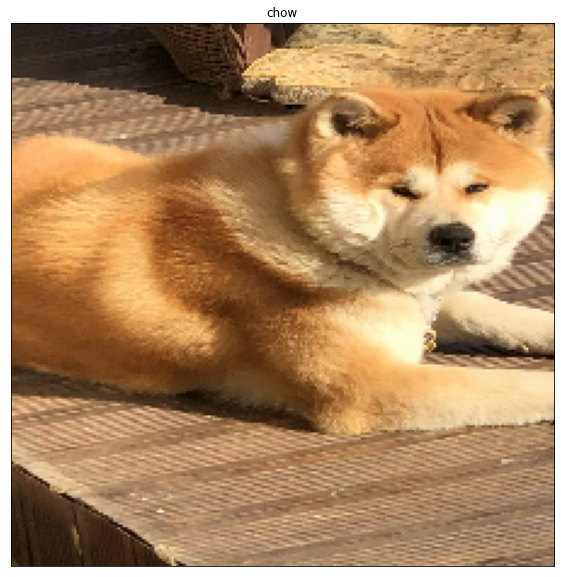

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images): # enumerate will look for images and count them, save the count number as i and save the images inside custom_images as images
  plt.subplot(1, 1, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
